In [1]:
from comet_ml import Experiment
from jupyterplot import ProgressPlot
from asset.utils import *
%matplotlib inline
dtype = torch.FloatTensor

torch.utils.backcompat.broadcast_warning.enabled = True
torch.manual_seed(1)
if torch.cuda.is_available():
    torch.cuda.manual_seed(1)
torch.cuda.empty_cache()

rand.seed(1)

np.random.seed(1)

cuda_devices = list()

infrencePhase=True
resolution=128
seqLength=20
maxResultSpeed=4
minResultSpeed=2
avDev = torch.device("cpu")
if torch.cuda.is_available(): #Change this block if you want to use GPU
    cuda_devices = [1] #Your GPU Number
    avDev = torch.device("cuda:"+str(cuda_devices[0]))
    if(len(cuda_devices) > 0):
        torch.cuda.set_device(cuda_devices[0])
batch_multiplier = max(len(cuda_devices), 1)


NOTVALID=cv2.resize(cv2.imread('asset/notValid.jpg')[:,:,1], dsize=(resolution-2, resolution-2), 
                                     interpolation=cv2.INTER_CUBIC)
NOTVALID=cv2.copyMakeBorder(NOTVALID, 1, 1, 1, 1, cv2.BORDER_CONSTANT, None, 0)
NOTVALID=torch.from_numpy(NOTVALID).unsqueeze(0).to(avDev).float()/255.

Files already downloaded and verified
Init worker seed: 1
torch.Size([100, 1, 20, 128, 128]) torch.FloatTensor tensor([1]) tensor([[[ 3., -4.]]], dtype=torch.float64)
Data: min and max 0.0 1.0


<b><span style="color: #ff0000">initailSeq (r)</span></b>  (1, 20, 128, 128, 1)

Image: min and max 0.0 1.0


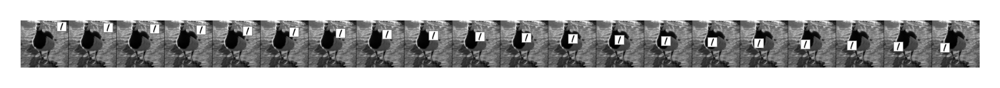

Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.005882353 1.0
Data[ 1 ]: min and max 0.0 0.99607843
Data[ 2 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">initailSeq (r)</span></b>  (1, 20, 530, 128, 1)

Image: min and max 0.0 1.0


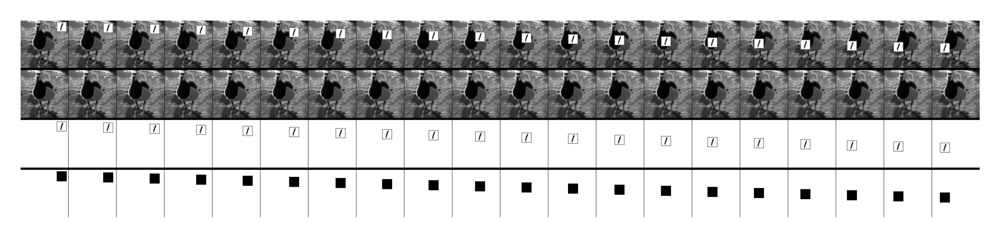

Data: min and max -1.0 1.0


<b><span style="color: #ff0000">rotA (N) (r)</span></b>  (1, 2, 128, 128, 1)

Image: min and max 0.0 1.0


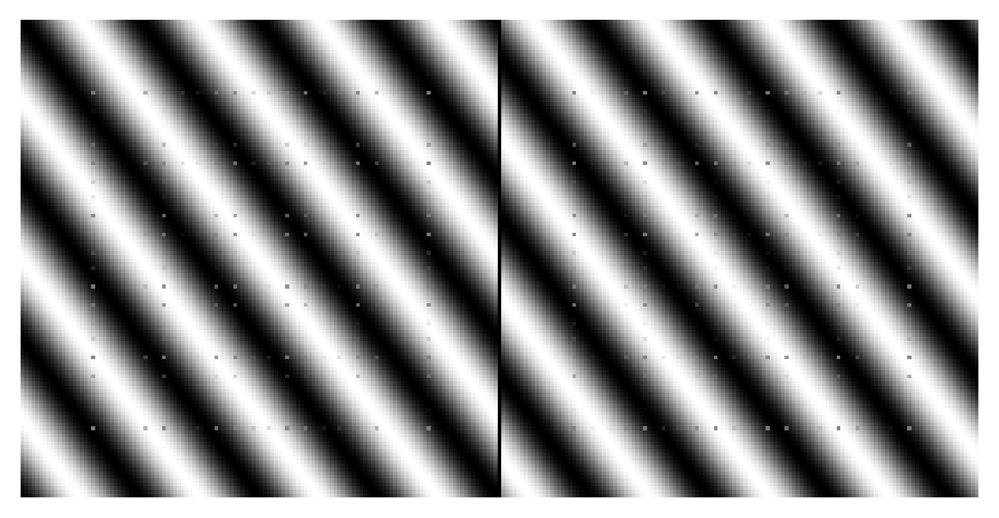

Data: min and max -1.0 1.0


<b><span style="color: #ff0000">rotFG (N) (r)</span></b>  (1, 2, 128, 128, 1)

Image: min and max 0.0 1.0


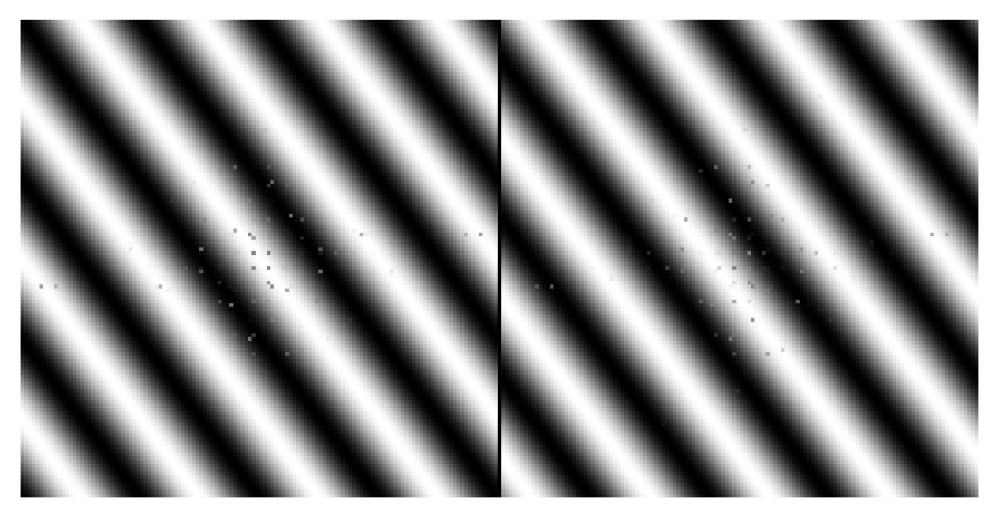

Data: min and max -1.0 1.0


<b><span style="color: #ff0000">rotTFG (N) (r)</span></b>  (1, 2, 128, 128, 1)

Image: min and max 0.0 1.0


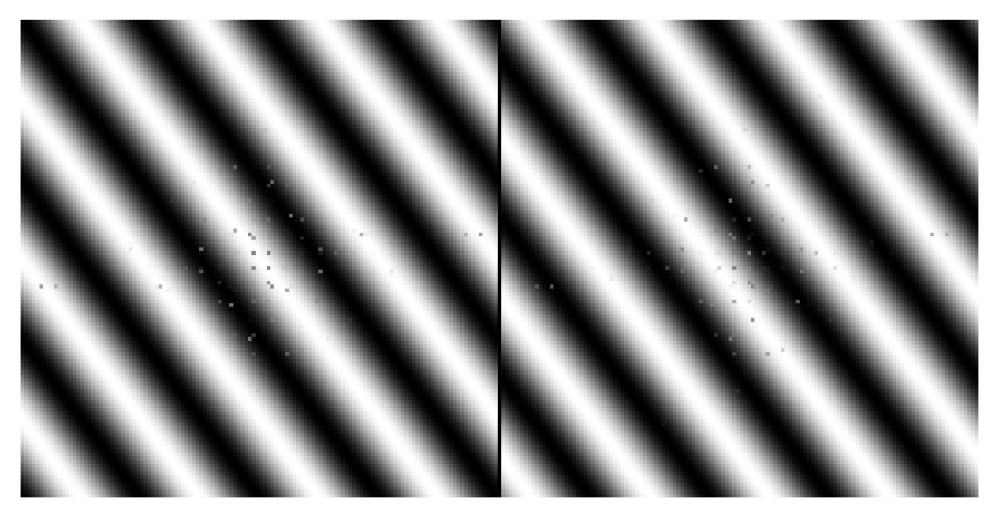

In [2]:
bs=100
def worker_init_fn(worker_id):  
    worker_id=worker_id+1
    print("Init worker seed:",worker_id)
    torch.manual_seed(worker_id)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(worker_id)
    rand.seed(worker_id)
    np.random.seed(worker_id)
    
ds = MovingFGOnBGDataset(infrencePhase=infrencePhase,seqLength=seqLength,shape=resolution,minResultSpeed=minResultSpeed,maxResultSpeed=maxResultSpeed,foregroundScale=1,background="STL10",foreground="MNIST")
ds_loader = DataLoader(ds,batch_size=bs, shuffle=not infrencePhase,num_workers=1,worker_init_fn=worker_init_fn)
for s in ds_loader:
    li=5;ui=li+1
    print(s['GT'].shape,s['GT'].type(),s['foreground'][li:ui],s["velocity"][li:ui])
    showSeq(False,-1,"initailSeq",s['GT'][li:ui].cpu(),oneD=False,dpi=3,revert=True)
    dataSet=s['GT'].to(avDev)
    dsBG=s['BG'].to(avDev)
    dsFG=s['FG'].to(avDev)
    dsAlpha=s['A'].to(avDev)
    showSeq(False,-1,"initailSeq",dataSet[li:ui].cpu(),[dsBG[li:ui].cpu(),dsFG[li:ui].cpu(),dsAlpha[li:ui].cpu()],oneD=dimention==1,dpi=3,revert=True)
    rotA,rotFG,rotTFG=generateAllRot(dsAlpha,dsFG)
    showSeq(True,1,"rotA",rotA.view(bs,resolution, resolution,2).permute(0,3,1,2).unsqueeze(1).cpu()[li:ui],revert=True)
    showSeq(True,1,"rotFG",rotFG.view(bs,resolution, resolution,2).permute(0,3,1,2).unsqueeze(1).cpu()[li:ui],revert=True)
    showSeq(True,1,"rotTFG",rotTFG.view(bs,resolution, resolution,2).permute(0,3,1,2).unsqueeze(1).cpu()[li:ui],revert=True)
    break

In [3]:
PAD=0
def occludedDS(ds,val=0,dim=5):
    return ds.clone()

def padDS(ds):
    return torch.nn.functional.pad(ds,(0,0,PAD,PAD,PAD,PAD))

class LocationAwareConv2d(torch.nn.Conv2d):
    def __init__(self,locationAware,gradient,w,h,in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=True):
        super().__init__(in_channels, out_channels, kernel_size, stride=stride, padding=padding, dilation=dilation, groups=groups, bias=bias)
        if locationAware:
            self.locationBias=torch.nn.Parameter(torch.zeros(w,h,2))
            self.locationEncode=torch.autograd.Variable(torch.ones(w,h,2))
            if gradient:
                for i in range(w):
                    self.locationEncode[i,:,1]=self.locationEncode[:,i,0]=i/float(w-1)
        
        self.w=w
        self.h=h
        self.locationAware=locationAware
    def forward(self,inputs):
        if self.locationAware:
            if self.locationBias.device != inputs.device:
                self.locationBias=self.locationBias.to(inputs.get_device())
            if self.locationEncode.device != inputs.device:
                self.locationEncode=self.locationEncode.to(inputs.get_device())
            b=self.locationBias*self.locationEncode
        convRes=super().forward(inputs)
        if convRes.shape[2]!=self.w and convRes.shape[3]!=self.h:
            convRes=torch.nn.functional.interpolate(convRes,size=(self.w,self.h), mode='bilinear', align_corners=False)
        if self.locationAware:
            return convRes+b[:,:,0]+b[:,:,1]
        else:
            return convRes

    
class ConvLSTMCell(torch.nn.Module):
    def __init__(self, w,h,input_size, hidden_size,kernel):
        super().__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        print("Omitted Padding =",kernel // 2)
        self.conv0 = LocationAwareConv2d(True,True,w,h,input_size + hidden_size, 4 * hidden_size,  kernel_size=kernel,  padding=0)
        torch.nn.init.xavier_uniform_(self.conv0.weight)

    def forward(self, inputs, preH, preC):
        batch_size = inputs.data.size()[0]
        spatial_size = inputs.data.size()[2:]
        if preH is None or preC is None:
            state_size = [batch_size, self.hidden_size] + list(spatial_size)
            preC = torch.zeros(state_size,device=inputs.get_device())
            preH = torch.zeros(state_size,device=inputs.get_device())
            
        i, f, o, c = self.conv0(torch.cat((inputs, preH), 1)).chunk(4, 1)
        i = torch.sigmoid(i)
        f = torch.sigmoid(f+1.0)
        o = torch.sigmoid(o)
        c = torch.tanh(c)
        newC = (f * preC) + (i * c)
        newH = o * torch.tanh(newC)
        return newH, newC

class VLNDecoderBlock(torch.nn.Module):
    def  __init__(self, w,h,in_channels,kernel):
        super().__init__()
        self.BN = torch.nn.ModuleList([torch.nn.BatchNorm2d(in_channels),torch.nn.BatchNorm2d(in_channels)])
        self.deConv0 = torch.nn.ConvTranspose2d(in_channels, in_channels, kernel, stride=2, padding=1)
        torch.nn.init.xavier_uniform_(self.deConv0.weight)
        self.LReLU = torch.nn.LeakyReLU(0.2)
        print("Omitted Padding =",1)
        self.conv0 = LocationAwareConv2d( True,True,w,h,in_channels,in_channels, kernel, stride=1, padding=0)
        torch.nn.init.xavier_uniform_(self.conv0.weight)
         
    def forward(self, inputs):
        resDeConv0 = self.deConv0(self.BN[0](inputs),output_size=[inputs.shape[0],inputs.shape[1],inputs.shape[2]*2,inputs.shape[3]*2])
        return self.conv0(self.LReLU(self.conv0(self.BN[1](self.LReLU(resDeConv0))))) + resDeConv0
    
class VLNEncoderBlock(torch.nn.Module):
    def  __init__(self, dilation,w,h, in_channels, out_channels,kernel):
        super().__init__()
        self.BN = torch.nn.ModuleList([torch.nn.BatchNorm2d(in_channels),torch.nn.BatchNorm2d(out_channels)])
        self.LReLU = torch.nn.LeakyReLU(0.2)
        self.ReLU = torch.nn.ReLU()
        print("Omitted Padding =",(kernel + (kernel-1)*(dilation-1))//2)
        self.conv0 = LocationAwareConv2d(LocationAware,LocationHint,w,h,in_channels, out_channels, kernel, padding=0, dilation=dilation)
        torch.nn.init.xavier_uniform_(self.conv0.weight)
        print("Omitted Padding =",(kernel + (kernel-1)*(2*dilation-1))//2)
        self.conv1 = LocationAwareConv2d(True,True,w,h,out_channels, out_channels, kernel,  padding=int(2*dilation)-1, dilation=int(2*dilation))
        torch.nn.init.xavier_uniform_(self.conv1.weight)
        self.conv3 = torch.nn.Conv2d(in_channels,out_channels, 1, padding=0, dilation=dilation)
        torch.nn.init.xavier_uniform_(self.conv3.weight)
        self.pooling = torch.nn.MaxPool2d([2, 2])
        

    def forward(self, inputs):
        nIn = self.BN[0](inputs.contiguous())
        res = self.BN[1](self.conv0(self.LReLU(nIn)))
        return self.ReLU(self.pooling(self.conv1(self.LReLU(res))+self.conv3(inputs)))


class VLN(torch.nn.Module):
    def __init__(self,w,h,channels,kernel):
        super().__init__()
        self.channels=channels
        self.encoders=torch.nn.ModuleList()
        for i in range(len(channels)):
            self.encoders.append(VLNEncoderBlock(w=int(w//(math.pow(2,i))),h=int(h//(math.pow(2,i))),dilation=int(math.pow(2,i)), in_channels=(3 if AI else 1) if i<1 else channels[i-1], out_channels=channels[i],kernel=kernel))
            
        self.decoders=torch.nn.ModuleList()
        for i in range(len(channels)):
            self.decoders.append(VLNDecoderBlock(w=int(w//(math.pow(2,i))),h=int(h//(math.pow(2,i))),in_channels=channels[i],kernel=kernel))
            
        self.convLSTMs=torch.nn.ModuleList()
        for i in range(len(channels)):
            self.convLSTMs.append(ConvLSTMCell(w=int(w//(math.pow(2,i+1))),h=int(h//(math.pow(2,i+1))),input_size=channels[i],hidden_size=channels[i],kernel=kernel))

        self.convCompressors=torch.nn.ModuleList()
        for i in range(len(channels)*2):
            if i%2==0:
                in_channels=(0 if i<1 else channels[(i//2)-1])+channels[i//2]
            else:
                in_channels=channels[i//2]*2
            self.convCompressors.append(torch.nn.Conv2d(in_channels,1 if i<1 else channels[(i-1)//2],1))
            torch.nn.init.xavier_uniform_(self.convCompressors[-1].weight)
        self.LReLu = torch.nn.LeakyReLU(0.2)
        
        self.locationEncode=torch.zeros(1,2,w,h)
        for i in range(w):
            self.locationEncode[0,1,:,i]=self.locationEncode[0,0,i,:]=i/float(w-1)
            
        

    def forward(self, inputs):   
        if self.locationEncode.device != inputs.device:
            self.locationEncode=self.locationEncode.to(inputs.get_device())
        
        hiddLSTM=[[None]for i in range(len(self.channels))]
        cellLSTM=[[None]for i in range(len(self.channels))]
        encoderActivation=[[None]for i in range(len(self.channels))]
        decoderActivation=[[None]for i in range(len(self.channels))]
        inputs=inputs.permute(1,0,4,3,2)
        res = [inputs[0]]
        for index,batch in enumerate(inputs[:-1]):
            for i in range(len(self.channels)):
                inputM=((batch if index<seedNumber else occludedDS(res[-1],val=0,dim=4)) if i<1 else encoderActivation[i-1][-1])
                if AI and i<1:
                    inputM=torch.cat((inputM,self.locationEncode.repeat(inputM.shape[0],1,1,1)),dim=1)
                encoderActivation[i].append(self.encoders[i](inputM))
                h,c=self.convLSTMs[i](encoderActivation[i][-1],hiddLSTM[i][-1],cellLSTM[i][-1])
                hiddLSTM[i].append(h)
                cellLSTM[i].append(c)
                
            conI=(len(self.channels)*2)-1
            for i in range(len(self.channels)-1,-1,-1):
                if i==len(self.channels)-1:
                    tmp=torch.cat((encoderActivation[i][-1], hiddLSTM[i][-1]), 1)
                    tmp=self.convCompressors[conI](tmp);conI=conI-1
                    decoderActivation[i].append(self.decoders[i](tmp))
                else:
                    
                    tmp=torch.cat((decoderActivation[i+1][-1],hiddLSTM[i][-1]),1)
                    tmp=self.convCompressors[conI](tmp);conI=conI-1
                    tmp=self.LReLu(tmp)
                    tmp=torch.cat((encoderActivation[i][-1],tmp),1)
                    tmp=self.convCompressors[conI](tmp);conI=conI-1
                    decoderActivation[i].append(self.decoders[i](tmp))
            
            res.append(torch.sigmoid(self.convCompressors[0](decoderActivation[0][-1])))
            
        res=torch.stack(res).permute(1,0,4,3,2)
        return res,encoderActivation,hiddLSTM,cellLSTM,decoderActivation

In [4]:
model=None
loss=None
optimizer=None
LocationHint=False
AI=True
LocationAware=True

def modelAccess(model):
    if(len(cuda_devices)>0):
        return model.module
    return model

LAYERS=[28, 58,90]
model=VLN(resolution,resolution,LAYERS,3)   

if infrencePhase:
    modelNameToLoad="VLNLABest.th"
else:
    modelNameToLoad="VLNLABest.th"
shouldLoadModel=True
loadIt = None
if os.path.exists(modelNameToLoad) and shouldLoadModel:
    try:
        loadIt = torch.load(modelNameToLoad,map_location=avDev)
        optimizer = loadIt["optimizer"]
        model.load_state_dict(loadIt["model"])
        print("Loaded")
    except:
        print("Some error happend while loading")
        
        

optimizer=torch.optim.Adam(model.parameters(), lr=0.001,weight_decay=0.0000,amsgrad=False)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=500, gamma=0.8, last_epoch=-1)
critBCE = torch.nn.BCELoss()
critL1 = torch.nn.L1Loss()
critL2 = torch.nn.MSELoss()

if len(cuda_devices)>0:
    with torch.cuda.device(cuda_devices[0]):
        model = torch.nn.DataParallel(model, device_ids=cuda_devices,dim=1).cuda()
        critBCE = critBCE.cuda()
        critL1 = critL1.cuda()
        critL2 = critL2.cuda()

                
def save_model(added=""):
    global model
    global optimizer
    
    saveIt = {
      'model': modelAccess(model).state_dict(),
      'optimizer': optimizer
    }
    
    strSave=str(datetime.datetime.now())+added
    torch.save(saveIt, strSave+".th")
    print("Model saved ",strSave+".th")
    
t=0

Omitted Padding = 1
Omitted Padding = 2
Omitted Padding = 2
Omitted Padding = 4
Omitted Padding = 4
Omitted Padding = 8
Omitted Padding = 1
Omitted Padding = 1
Omitted Padding = 1
Omitted Padding = 1
Omitted Padding = 1
Omitted Padding = 1
Loaded


In [5]:
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=500, gamma=0.95, last_epoch=-1)

In [6]:
t=0
def adjust_lr(lr):
    global optimizer
    for param_group in optimizer.param_groups:
        param_group['lr'] = lr
        
adjust_lr(0.0002)

Init worker seed: 1
Init worker seed: 2
Init worker seed: 3
Init worker seed: 4
Init worker seed: 5Init worker seed:
 6Init worker seed:
 7
Init worker seed:8 
0 bceMin= 0.56787  bceNetFull= 0.56956  bceNet= 0.56956  L1Net= 0.01196  L2Net= 0.00055  SSIM= 0.96661
Number of Parameters =  1460205
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


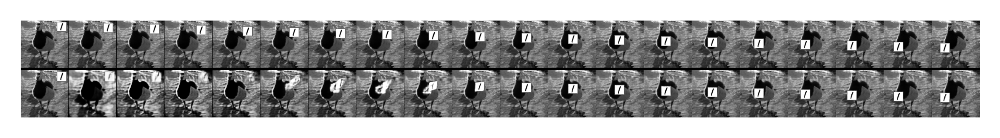

Data: min and max 1.09819105e-07 0.39375407


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.49999988079071045


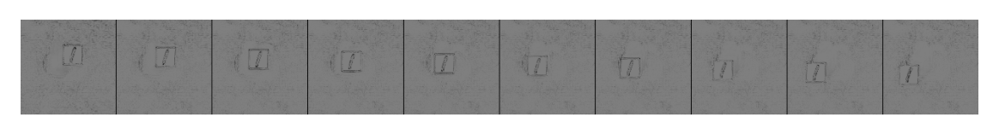

1 bceMin= 0.53342  bceNetFull= 0.53549  bceNet= 0.53549  L1Net= 0.01328  L2Net= 0.00068  SSIM= 0.96472
2 bceMin= 0.54645  bceNetFull= 0.54840  bceNet= 0.54840  L1Net= 0.01180  L2Net= 0.00062  SSIM= 0.97206
3 bceMin= 0.52691  bceNetFull= 0.52889  bceNet= 0.52889  L1Net= 0.01360  L2Net= 0.00064  SSIM= 0.96860
4 bceMin= 0.54186  bceNetFull= 0.54426  bceNet= 0.54426  L1Net= 0.01500  L2Net= 0.00084  SSIM= 0.96415
5 bceMin= 0.51625  bceNetFull= 0.51833  bceNet= 0.51833  L1Net= 0.01232  L2Net= 0.00065  SSIM= 0.96865
6 bceMin= 0.52055  bceNetFull= 0.52295  bceNet= 0.52295  L1Net= 0.01249  L2Net= 0.00075  SSIM= 0.96970
7 bceMin= 0.53241  bceNetFull= 0.53503  bceNet= 0.53503  L1Net= 0.01537  L2Net= 0.00083  SSIM= 0.96225
Number of Parameters =  1460205
Data: min and max 0.0 0.99607843
Data[ 0 ]: min and max 0.0 0.999876


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


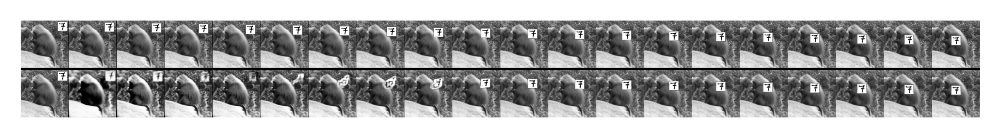

Data: min and max 4.5446125e-08 0.6488491


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999999403953552


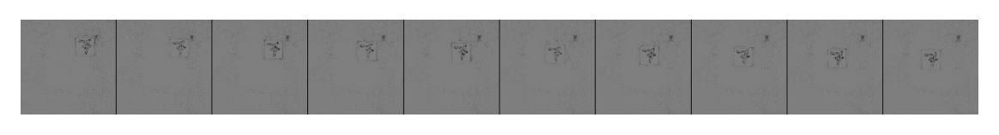

8 bceMin= 0.53435  bceNetFull= 0.53648  bceNet= 0.53648  L1Net= 0.01327  L2Net= 0.00067  SSIM= 0.96507
9 bceMin= 0.53843  bceNetFull= 0.54060  bceNet= 0.54060  L1Net= 0.01431  L2Net= 0.00072  SSIM= 0.96240
10 bceMin= 0.52515  bceNetFull= 0.52722  bceNet= 0.52722  L1Net= 0.01224  L2Net= 0.00068  SSIM= 0.96573
11 bceMin= 0.50311  bceNetFull= 0.50522  bceNet= 0.50522  L1Net= 0.01348  L2Net= 0.00066  SSIM= 0.96846
12 bceMin= 0.53274  bceNetFull= 0.53470  bceNet= 0.53470  L1Net= 0.01224  L2Net= 0.00063  SSIM= 0.97523
13 bceMin= 0.56160  bceNetFull= 0.56350  bceNet= 0.56350  L1Net= 0.01237  L2Net= 0.00061  SSIM= 0.96977
14 bceMin= 0.58436  bceNetFull= 0.58639  bceNet= 0.58639  L1Net= 0.01292  L2Net= 0.00067  SSIM= 0.96762
Number of Parameters =  1460205
Data: min and max 0.0 0.99607843
Data[ 0 ]: min and max 0.0 0.9995859


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


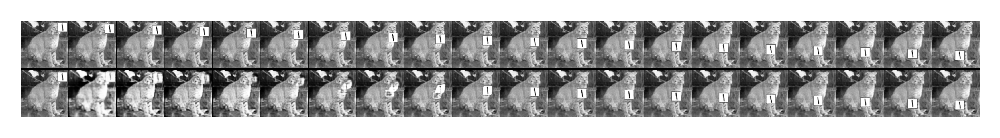

Data: min and max 1.476233e-08 0.47999215


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.5


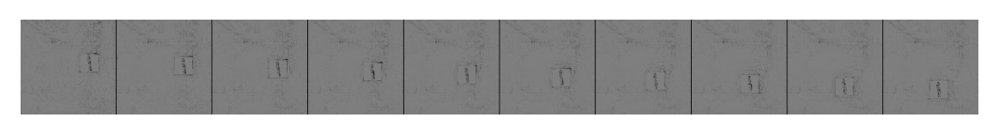

15 bceMin= 0.56212  bceNetFull= 0.56407  bceNet= 0.56407  L1Net= 0.01199  L2Net= 0.00065  SSIM= 0.97118
16 bceMin= 0.56912  bceNetFull= 0.57138  bceNet= 0.57138  L1Net= 0.01228  L2Net= 0.00072  SSIM= 0.96583
17 bceMin= 0.53638  bceNetFull= 0.53812  bceNet= 0.53812  L1Net= 0.01089  L2Net= 0.00055  SSIM= 0.97361
18 bceMin= 0.52808  bceNetFull= 0.52997  bceNet= 0.52997  L1Net= 0.01259  L2Net= 0.00061  SSIM= 0.97004
19 bceMin= 0.47282  bceNetFull= 0.47488  bceNet= 0.47488  L1Net= 0.01237  L2Net= 0.00062  SSIM= 0.97076
20 bceMin= 0.54835  bceNetFull= 0.55025  bceNet= 0.55025  L1Net= 0.01268  L2Net= 0.00062  SSIM= 0.96667
21 bceMin= 0.58055  bceNetFull= 0.58230  bceNet= 0.58230  L1Net= 0.01254  L2Net= 0.00059  SSIM= 0.96536
Number of Parameters =  1460205
Data: min and max 0.0 0.99803925
Data[ 0 ]: min and max 0.0 0.9999949


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


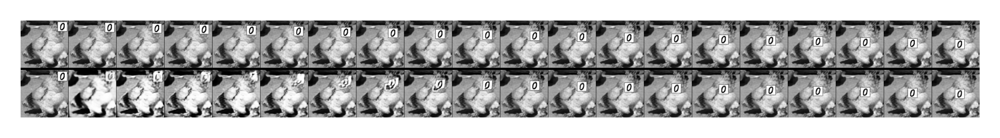

Data: min and max 3.7708936e-08 0.4289918


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999999403953552


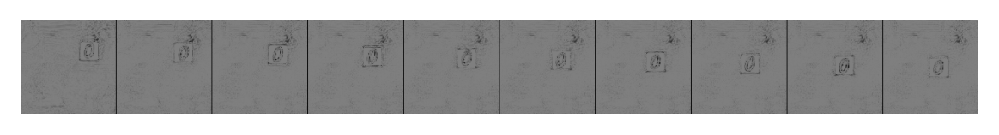

22 bceMin= 0.55455  bceNetFull= 0.55640  bceNet= 0.55640  L1Net= 0.01101  L2Net= 0.00058  SSIM= 0.97086
23 bceMin= 0.49459  bceNetFull= 0.49687  bceNet= 0.49687  L1Net= 0.01294  L2Net= 0.00069  SSIM= 0.97191
24 bceMin= 0.57905  bceNetFull= 0.58134  bceNet= 0.58134  L1Net= 0.01323  L2Net= 0.00077  SSIM= 0.96609
25 bceMin= 0.53102  bceNetFull= 0.53302  bceNet= 0.53302  L1Net= 0.01317  L2Net= 0.00065  SSIM= 0.96960
26 bceMin= 0.50879  bceNetFull= 0.51094  bceNet= 0.51094  L1Net= 0.01307  L2Net= 0.00070  SSIM= 0.97149
27 bceMin= 0.53643  bceNetFull= 0.53833  bceNet= 0.53833  L1Net= 0.01177  L2Net= 0.00059  SSIM= 0.97060
28 bceMin= 0.55086  bceNetFull= 0.55283  bceNet= 0.55283  L1Net= 0.01316  L2Net= 0.00065  SSIM= 0.96363
Number of Parameters =  1460205
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


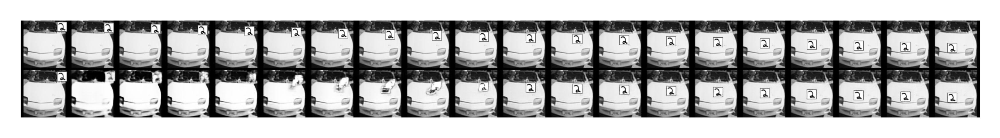

Data: min and max 3.0012682e-08 0.71872574


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.5


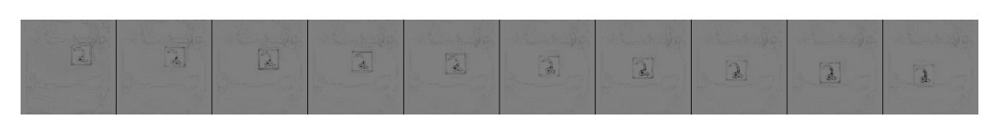

29 bceMin= 0.55438  bceNetFull= 0.55670  bceNet= 0.55670  L1Net= 0.01339  L2Net= 0.00074  SSIM= 0.96804
30 bceMin= 0.52372  bceNetFull= 0.52590  bceNet= 0.52590  L1Net= 0.01199  L2Net= 0.00067  SSIM= 0.96967
31 bceMin= 0.48641  bceNetFull= 0.48846  bceNet= 0.48846  L1Net= 0.01182  L2Net= 0.00063  SSIM= 0.97135
32 bceMin= 0.53456  bceNetFull= 0.53641  bceNet= 0.53641  L1Net= 0.01229  L2Net= 0.00061  SSIM= 0.96582
33 bceMin= 0.55071  bceNetFull= 0.55274  bceNet= 0.55274  L1Net= 0.01322  L2Net= 0.00065  SSIM= 0.96633
34 bceMin= 0.51258  bceNetFull= 0.51454  bceNet= 0.51454  L1Net= 0.01302  L2Net= 0.00063  SSIM= 0.96848
35 bceMin= 0.51232  bceNetFull= 0.51435  bceNet= 0.51435  L1Net= 0.01261  L2Net= 0.00065  SSIM= 0.96656
Number of Parameters =  1460205
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


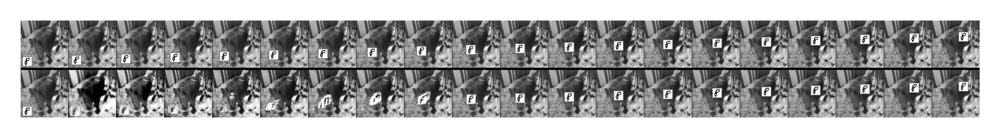

Data: min and max 5.9604645e-08 0.8641313


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999999403953552


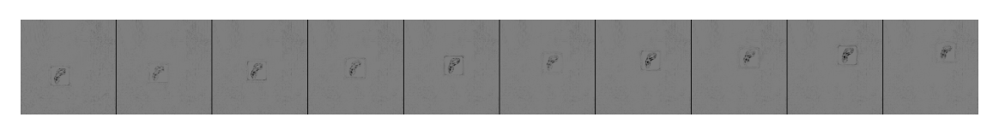

36 bceMin= 0.51864  bceNetFull= 0.52085  bceNet= 0.52085  L1Net= 0.01247  L2Net= 0.00071  SSIM= 0.96879
37 bceMin= 0.53400  bceNetFull= 0.53609  bceNet= 0.53609  L1Net= 0.01305  L2Net= 0.00067  SSIM= 0.97048
38 bceMin= 0.49125  bceNetFull= 0.49345  bceNet= 0.49345  L1Net= 0.01270  L2Net= 0.00065  SSIM= 0.96699
39 bceMin= 0.57023  bceNetFull= 0.57225  bceNet= 0.57225  L1Net= 0.01255  L2Net= 0.00067  SSIM= 0.96077
40 bceMin= 0.51364  bceNetFull= 0.51602  bceNet= 0.51602  L1Net= 0.01305  L2Net= 0.00075  SSIM= 0.97092
41 bceMin= 0.54337  bceNetFull= 0.54489  bceNet= 0.54489  L1Net= 0.01123  L2Net= 0.00049  SSIM= 0.97220
42 bceMin= 0.48230  bceNetFull= 0.48503  bceNet= 0.48503  L1Net= 0.01376  L2Net= 0.00083  SSIM= 0.96959
Number of Parameters =  1460205
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


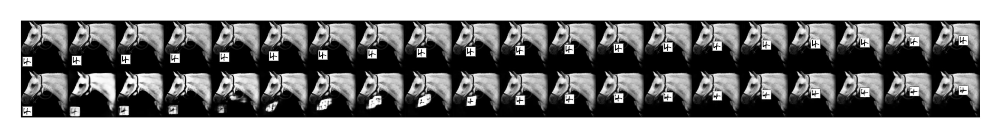

Data: min and max 5.2101353e-08 0.9672531


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.5


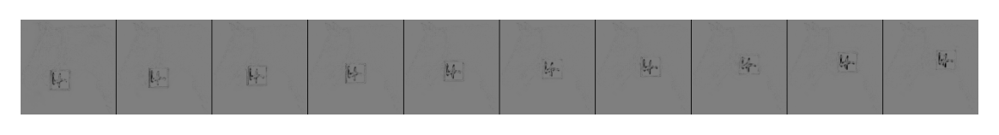

43 bceMin= 0.52962  bceNetFull= 0.53180  bceNet= 0.53180  L1Net= 0.01343  L2Net= 0.00072  SSIM= 0.96734
44 bceMin= 0.51745  bceNetFull= 0.51980  bceNet= 0.51980  L1Net= 0.01244  L2Net= 0.00072  SSIM= 0.97144
45 bceMin= 0.55676  bceNetFull= 0.55843  bceNet= 0.55843  L1Net= 0.01170  L2Net= 0.00054  SSIM= 0.97007
46 bceMin= 0.57293  bceNetFull= 0.57549  bceNet= 0.57549  L1Net= 0.01438  L2Net= 0.00082  SSIM= 0.96631
47 bceMin= 0.53854  bceNetFull= 0.54078  bceNet= 0.54078  L1Net= 0.01413  L2Net= 0.00074  SSIM= 0.96124
48 bceMin= 0.52743  bceNetFull= 0.52923  bceNet= 0.52923  L1Net= 0.01122  L2Net= 0.00059  SSIM= 0.97264
49 bceMin= 0.50134  bceNetFull= 0.50386  bceNet= 0.50386  L1Net= 0.01449  L2Net= 0.00083  SSIM= 0.96809
Number of Parameters =  1460205
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


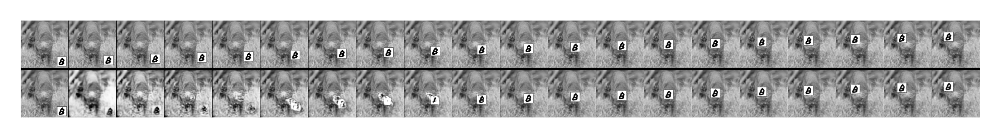

Data: min and max 5.9604645e-08 0.8839264


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999999403953552


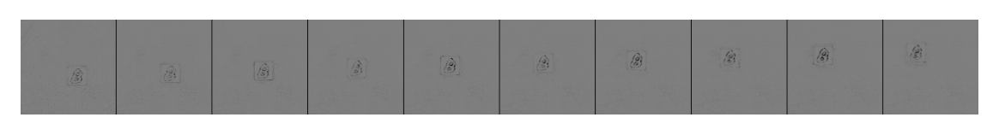

50 bceMin= 0.56907  bceNetFull= 0.57099  bceNet= 0.57099  L1Net= 0.01369  L2Net= 0.00064  SSIM= 0.97083
51 bceMin= 0.50407  bceNetFull= 0.50658  bceNet= 0.50658  L1Net= 0.01338  L2Net= 0.00080  SSIM= 0.96623
52 bceMin= 0.53890  bceNetFull= 0.54074  bceNet= 0.54074  L1Net= 0.01070  L2Net= 0.00058  SSIM= 0.97270
53 bceMin= 0.54044  bceNetFull= 0.54241  bceNet= 0.54241  L1Net= 0.01248  L2Net= 0.00063  SSIM= 0.96821
54 bceMin= 0.50806  bceNetFull= 0.51053  bceNet= 0.51053  L1Net= 0.01220  L2Net= 0.00074  SSIM= 0.97077
55 bceMin= 0.54636  bceNetFull= 0.54828  bceNet= 0.54828  L1Net= 0.01202  L2Net= 0.00061  SSIM= 0.96736
56 bceMin= 0.51117  bceNetFull= 0.51323  bceNet= 0.51323  L1Net= 0.01211  L2Net= 0.00064  SSIM= 0.97063
Number of Parameters =  1460205
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


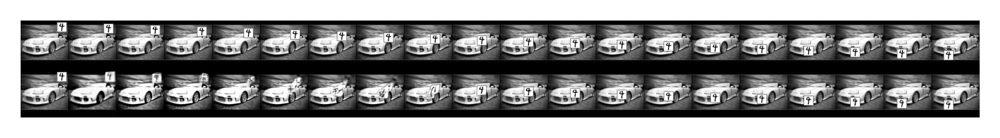

Data: min and max 0.0 0.75137544


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.5


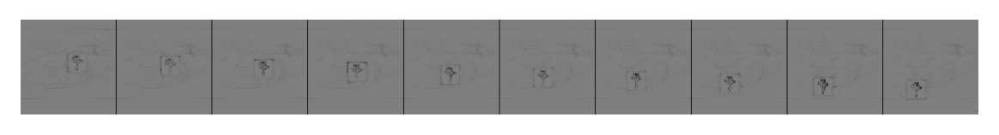

57 bceMin= 0.51527  bceNetFull= 0.51730  bceNet= 0.51730  L1Net= 0.01216  L2Net= 0.00067  SSIM= 0.96856
58 bceMin= 0.50062  bceNetFull= 0.50261  bceNet= 0.50261  L1Net= 0.01219  L2Net= 0.00062  SSIM= 0.97267
59 bceMin= 0.48487  bceNetFull= 0.48759  bceNet= 0.48759  L1Net= 0.01382  L2Net= 0.00082  SSIM= 0.96502
60 bceMin= 0.52477  bceNetFull= 0.52671  bceNet= 0.52671  L1Net= 0.01130  L2Net= 0.00062  SSIM= 0.97301
61 bceMin= 0.52783  bceNetFull= 0.52952  bceNet= 0.52952  L1Net= 0.01087  L2Net= 0.00051  SSIM= 0.97322
62 bceMin= 0.57863  bceNetFull= 0.58045  bceNet= 0.58045  L1Net= 0.01254  L2Net= 0.00060  SSIM= 0.96759
63 bceMin= 0.52077  bceNetFull= 0.52327  bceNet= 0.52327  L1Net= 0.01312  L2Net= 0.00073  SSIM= 0.97003
Number of Parameters =  1460205
Data: min and max 0.0 0.99607843
Data[ 0 ]: min and max 0.0 0.99975556


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


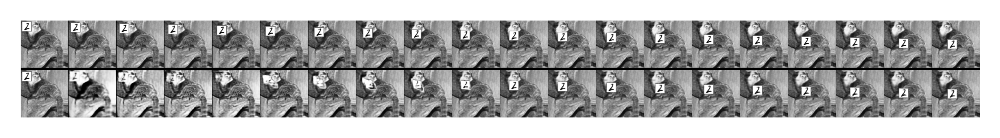

Data: min and max 7.9679076e-08 0.72619796


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999999403953552


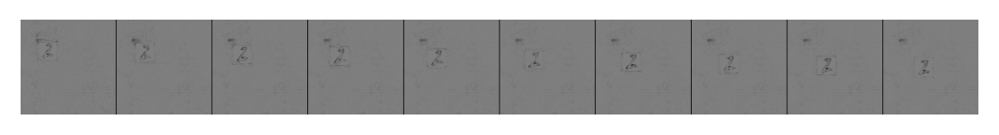

64 bceMin= 0.51663  bceNetFull= 0.51888  bceNet= 0.51888  L1Net= 0.01400  L2Net= 0.00067  SSIM= 0.96407
65 bceMin= 0.52921  bceNetFull= 0.53137  bceNet= 0.53137  L1Net= 0.01278  L2Net= 0.00067  SSIM= 0.96546
66 bceMin= 0.51043  bceNetFull= 0.51254  bceNet= 0.51254  L1Net= 0.01252  L2Net= 0.00068  SSIM= 0.96883
67 bceMin= 0.51369  bceNetFull= 0.51574  bceNet= 0.51574  L1Net= 0.01261  L2Net= 0.00064  SSIM= 0.96940
68 bceMin= 0.49722  bceNetFull= 0.49946  bceNet= 0.49946  L1Net= 0.01385  L2Net= 0.00070  SSIM= 0.96811
69 bceMin= 0.50713  bceNetFull= 0.50959  bceNet= 0.50959  L1Net= 0.01437  L2Net= 0.00075  SSIM= 0.96574
70 bceMin= 0.52158  bceNetFull= 0.52368  bceNet= 0.52368  L1Net= 0.01328  L2Net= 0.00066  SSIM= 0.96882
Number of Parameters =  1460205
Data: min and max 0.0 0.9901961
Data[ 0 ]: min and max 0.0 0.99993646


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


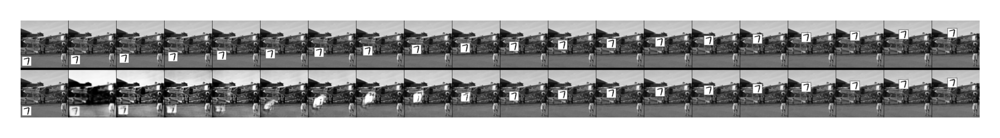

Data: min and max 0.0 0.43149552


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.5


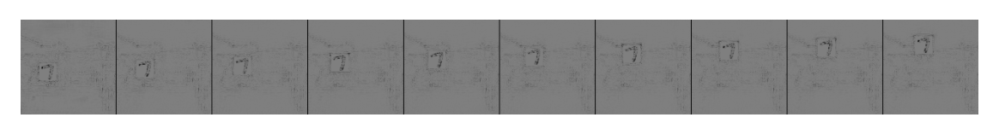

71 bceMin= 0.51426  bceNetFull= 0.51635  bceNet= 0.51635  L1Net= 0.01105  L2Net= 0.00064  SSIM= 0.97485
72 bceMin= 0.55286  bceNetFull= 0.55474  bceNet= 0.55474  L1Net= 0.01195  L2Net= 0.00060  SSIM= 0.97209
73 bceMin= 0.55250  bceNetFull= 0.55438  bceNet= 0.55438  L1Net= 0.01014  L2Net= 0.00059  SSIM= 0.97300
74 bceMin= 0.50477  bceNetFull= 0.50685  bceNet= 0.50685  L1Net= 0.01210  L2Net= 0.00064  SSIM= 0.96870
75 bceMin= 0.55368  bceNetFull= 0.55527  bceNet= 0.55527  L1Net= 0.01141  L2Net= 0.00050  SSIM= 0.97174
76 bceMin= 0.53124  bceNetFull= 0.53314  bceNet= 0.53314  L1Net= 0.01315  L2Net= 0.00061  SSIM= 0.96654
77 bceMin= 0.52554  bceNetFull= 0.52752  bceNet= 0.52752  L1Net= 0.01247  L2Net= 0.00061  SSIM= 0.96842
Number of Parameters =  1460205
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


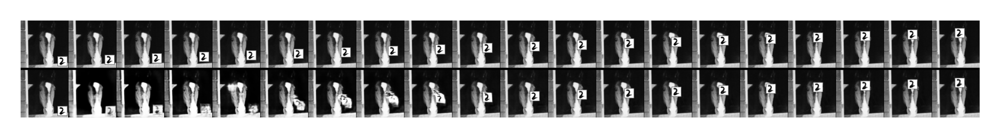

Data: min and max 0.0 0.7624072


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.5


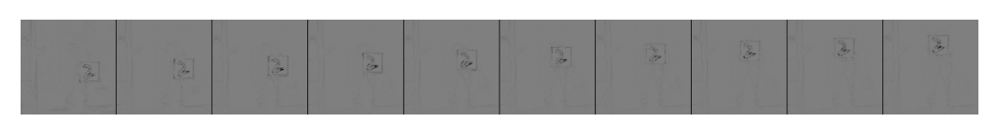

78 bceMin= 0.56644  bceNetFull= 0.56884  bceNet= 0.56884  L1Net= 0.01419  L2Net= 0.00079  SSIM= 0.96293
79 bceMin= 0.51314  bceNetFull= 0.51543  bceNet= 0.51543  L1Net= 0.01431  L2Net= 0.00071  SSIM= 0.96824
80 bceMin= 0.53089  bceNetFull= 0.53295  bceNet= 0.53295  L1Net= 0.01103  L2Net= 0.00063  SSIM= 0.97276
81 bceMin= 0.52490  bceNetFull= 0.52729  bceNet= 0.52729  L1Net= 0.01390  L2Net= 0.00075  SSIM= 0.96646
82 bceMin= 0.53629  bceNetFull= 0.53796  bceNet= 0.53796  L1Net= 0.01156  L2Net= 0.00054  SSIM= 0.97115
83 bceMin= 0.54799  bceNetFull= 0.54978  bceNet= 0.54978  L1Net= 0.01104  L2Net= 0.00058  SSIM= 0.97100
84 bceMin= 0.50284  bceNetFull= 0.50519  bceNet= 0.50519  L1Net= 0.01248  L2Net= 0.00072  SSIM= 0.96735
Number of Parameters =  1460205
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


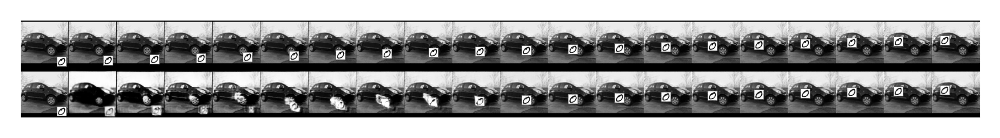

Data: min and max 0.0 0.69410926


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.5


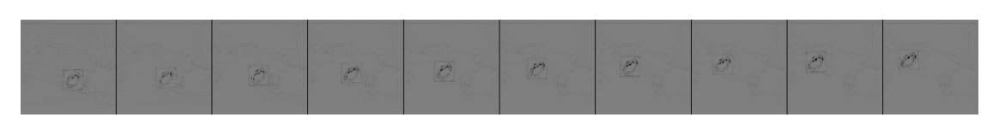

85 bceMin= 0.46553  bceNetFull= 0.46764  bceNet= 0.46764  L1Net= 0.01189  L2Net= 0.00058  SSIM= 0.97406
86 bceMin= 0.50133  bceNetFull= 0.50326  bceNet= 0.50326  L1Net= 0.01114  L2Net= 0.00060  SSIM= 0.97317
87 bceMin= 0.48084  bceNetFull= 0.48358  bceNet= 0.48358  L1Net= 0.01396  L2Net= 0.00081  SSIM= 0.96923
88 bceMin= 0.53993  bceNetFull= 0.54172  bceNet= 0.54172  L1Net= 0.01186  L2Net= 0.00057  SSIM= 0.96713
89 bceMin= 0.56856  bceNetFull= 0.57088  bceNet= 0.57088  L1Net= 0.01270  L2Net= 0.00072  SSIM= 0.96713
90 bceMin= 0.51280  bceNetFull= 0.51503  bceNet= 0.51503  L1Net= 0.01355  L2Net= 0.00072  SSIM= 0.96775
91 bceMin= 0.53712  bceNetFull= 0.53900  bceNet= 0.53900  L1Net= 0.01195  L2Net= 0.00062  SSIM= 0.96786
Number of Parameters =  1460205
Data: min and max 0.0 0.9892157
Data[ 0 ]: min and max 0.0 0.99995494


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


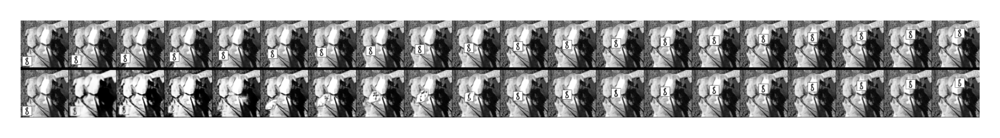

Data: min and max 5.2555478e-08 0.6631539


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999999403953552


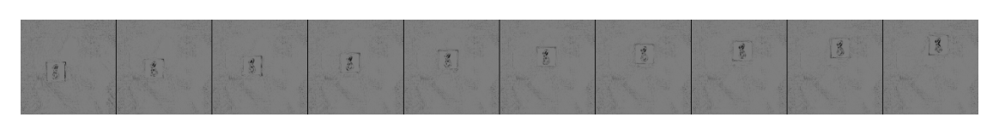

92 bceMin= 0.51611  bceNetFull= 0.51842  bceNet= 0.51842  L1Net= 0.01352  L2Net= 0.00072  SSIM= 0.96935
93 bceMin= 0.55012  bceNetFull= 0.55226  bceNet= 0.55226  L1Net= 0.01187  L2Net= 0.00068  SSIM= 0.96851
94 bceMin= 0.54163  bceNetFull= 0.54331  bceNet= 0.54331  L1Net= 0.01194  L2Net= 0.00053  SSIM= 0.96532
95 bceMin= 0.53845  bceNetFull= 0.54047  bceNet= 0.54047  L1Net= 0.01176  L2Net= 0.00064  SSIM= 0.97153
96 bceMin= 0.54645  bceNetFull= 0.54832  bceNet= 0.54832  L1Net= 0.01355  L2Net= 0.00061  SSIM= 0.96742
97 bceMin= 0.53372  bceNetFull= 0.53587  bceNet= 0.53587  L1Net= 0.01262  L2Net= 0.00067  SSIM= 0.96955
98 bceMin= 0.50664  bceNetFull= 0.50877  bceNet= 0.50877  L1Net= 0.01239  L2Net= 0.00063  SSIM= 0.96735
Number of Parameters =  1460205
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


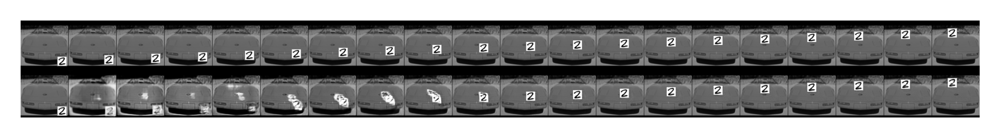

Data: min and max 5.9604645e-08 0.6587226


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999999403953552


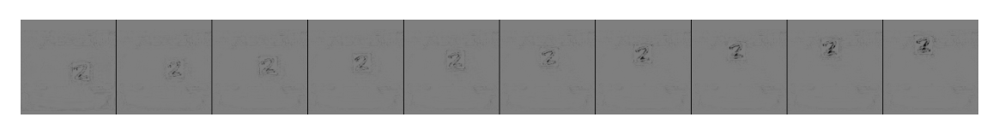

99 bceMin= 0.48639  bceNetFull= 0.48866  bceNet= 0.48866  L1Net= 0.01281  L2Net= 0.00070  SSIM= 0.97068
100 bceMin= 0.51263  bceNetFull= 0.51473  bceNet= 0.51473  L1Net= 0.01357  L2Net= 0.00067  SSIM= 0.96521
BCEMin= 0.5292342024864537  BCE= 0.5313255899023301  L1= 0.01264517566207612  L2= 0.0006614806485537551  SSIM= 0.9686686892320614


BaseException: end here

In [7]:
if infrencePhase:
    rand.seed(1);np.random.seed(1);t=0;infrenceRes=[]
if infrencePhase:
    paintEvery=7
else:
    paintEvery=300
saveEvery=1000
if infrencePhase:
    bs=10
else:
    bs=8

if infrencePhase:
    runs=100
else:
    runs=2000000
    
    
torch.set_grad_enabled(not infrencePhase)    
ds_loader = DataLoader(ds,batch_size=bs, shuffle=not infrencePhase,num_workers=8,worker_init_fn=worker_init_fn)
ds_iter=iter(ds_loader)
while t <= runs:
    if(t%1==0):
        try:
            s=next(ds_iter)
        except StopIteration:
            ds_iter=iter(ds_loader)
            s=next(ds_iter)
        
        dataSet=s['GT'].to(avDev)
        dsBG=s['BG'].to(avDev)
        dsFG=s['FG'].to(avDev)
        dsAlpha=s['A'].to(avDev)
        dsVel=s["velocity"]
        
    if  t>0 and t%saveEvery==0:
        save_model(theNotebook+str(t//saveEvery))
    dataSetCTarget = None
    dataSet=padDS(dataSet)
    temp_ds = dataSet.float().permute(0,2,3,4,1).contiguous()
    batch_ds = temp_ds.requires_grad_()

    if(len(cuda_devices)>0):
        with torch.cuda.device(cuda_devices[0]):
                batch_ds=batch_ds.cuda()

    pre_frames_batch,encoderActivation,hiddLSTM,cellLSTM,decoderActivation=model(occludedDS(batch_ds))
    optimizer.zero_grad()

    netOut = pre_frames_batch[:,seedNumber:,:,:,:]
    target = batch_ds[:,seedNumber:,:,:,:].detach()
    
    bceNetFull = critBCE(netOut,target) 
    
    bceNet=bceNetFull
    bceMin=critBCE(target,target)
    L1NetDiff = (netOut-target).abs()
    L1Net=L1NetDiff.mean()
    L2Net=critL2(netOut,target)
    ssimL=ssim(netOut.reshape(netOut.shape[0]*netOut.shape[1],1,netOut.shape[2],netOut.shape[3]), target.reshape(target.shape[0]*target.shape[1],1,target.shape[2],target.shape[3]))

    print(t,"bceMin=","%0.5f" %bceMin.item()," bceNetFull=","%0.5f" %bceNetFull.item()," bceNet=","%0.5f" %bceNet.item()," L1Net=","%0.5f" %L1Net.item()," L2Net=","%0.5f" %L2Net.item(), " SSIM=","%0.5f" %ssimL)
#     writer.add_scalar("bceNetFull",bceNetFull.item(),t);writer.add_scalar("bceNet",bceNet.item(),t);writer.add_scalar("L1Net",L1Net.item(),t);writer.add_scalar("L2Net",L2Net.item(),t);
    
    if not infrencePhase:
        bceNetFull.backward()
        optimizer.step()
    else:
        infrenceRes.append([bceMin.item(),bceNet.item(),L1Net.item(),L2Net.item(),ssimL.item()])
        
    if t%paintEvery==0:
        r1=5
        r2=min(bs,6)
        print("Number of Parameters = ",sum(p.numel() for p in model.parameters() if p.requires_grad))
        showSeq(False,t,"GT,Pred",batch_ds[r1:r2].permute(0,4,1,2,3).cpu(),[(pre_frames_batch.permute(0,4,1,2,3).data[r1:r2]).cpu()],oneD=(dimention==1),revert=True,dpi=3)
        showSeq(True,t,"diffNet",L1NetDiff.permute(0,4,1,2,3).detach()[r1:r2].cpu(),oneD=dimention==1,revert=True)

    t=t+1

    if(infrencePhase and t>runs):
        infrenceRes=np.array(infrenceRes)
        print("BCEMin=",infrenceRes[:,0].mean()," BCE=",infrenceRes[:,1].mean()," L1=",infrenceRes[:,2].mean()," L2=",infrenceRes[:,3].mean()," SSIM=",infrenceRes[:,4].mean())
        raise BaseException("end here")

In [11]:
save_model("VLNLABest")

Model saved  2020-02-21 11:03:09.384824VLNLABest.th
